# Predicting Electricity Consumption Using Recurrent Neural Network

The goal is to use a recurrent neural network that must learn to predict a the electricity consumption of households in Poland. 

First define a list of parameters that will use in all this notebook. By doing so, it is easy to change their values and makes several experiments by executing all the cells.


In [37]:
params = {}
params['train_test_ratio'] =  0.7 # training: 70 percent of data (training and validation )
#test: 30 percent of data
params['train_val_ratio'] = 0.3 # 0.3: 30 percent of training data is validation and remaining 70 is to train/learn parameters
params['history'] =  20
params['horizon'] =  10
params['num_hidden_units'] = 20
params['num_layers'] = 1
params['optimization_alg'] = 'rmsprop' #'adam' 
params['batch_size'] =  256
params['num_epochs'] = 20

In [38]:
## Loading the dataset
import pickle

data = pickle.load(open('pse.pkl', 'rb'))

We import all the necessary libraries:

In [39]:
from keras.layers.core import Dense, Activation  
from keras.layers.recurrent import LSTM
from keras.layers import Input, LSTM, RepeatVector, merge
from keras.models import Model

from keras.layers.core import Dense, Activation  
from keras.layers.recurrent import LSTM
from keras.layers import Input, LSTM, Flatten, Bidirectional, Reshape
from keras.layers import RepeatVector, merge
from keras.models import Model

import numpy as np

## Building the dataset

We first have to build the initial dataset. This dataset is a list of points ${(x_0,f_0), \ldots, (x_n,f_n)})$. We will consider here that $x_i = i$ and $f_i = sin(2*\pi*k)$ where $k = \frac{frequency}{n}$. As $x_i = i$, we will build a one dimensional Python list 



Plot your sequence to check it is correct (see [notebook08](Python4Maths/Intro-to-Python/08.ipynb))

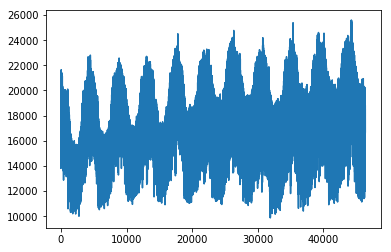

In [40]:
import matplotlib.pyplot as plt

%matplotlib inline

plt.plot(data)
# to complete

## Preparing data

`sequence` is our dataset of examples for our supervised learning task. We must first split it in two sub-lists:
* one list for training
* one list for validation

    The simplest way to do it is to keep the $n\%$ first examples as training part, and the remaining for testing. The following function will create the two corresponding indices.


In [41]:
def get_tr_test_index(data_len, tr_ratio):
    """
    returns the training and test indices for the given tr_ratio
    if tr_ratio is 0.5, return indices as two equal parts: the first half as training and 
    the second half is as test
    """
    train_index = range(0,int(data_len*tr_ratio))
    test_index = range(int(data_len*tr_ratio),data_len)
    return (train_index, test_index)


The indices can now be used to extract the training and testing datasets using the slicing mechanism (see [notebook 03](Python4Maths/Intro-to-Python/03.ipynb), slicing section)

In [42]:
def get_train_test(data, tr_ratio):
    """
    splits into two parts according to given tr_ratio
    if tr_ratio is 0.5, it divides indices in two equal parts first half training and 
    second half is test
    """
    data_len = len(data)
    (train_index, test_index) = get_tr_test_index(data_len, tr_ratio)
    train, test = (data[train_index], data[test_index])
    return (train, test)

Neural networks have better results when manipulating values around 0. In the next step, we will normalize our training and testing data. One way to normalize data is to subtract its mean value and divide it by its standard deviation to bring it around $[-1, 1]$. This is a general principle. It is of course not very necessary on this particular example here with a $sinus$ fonction.....

The `normalize` function takes three parameters: `data`, `mean` and `std`. If `mean` and `std` are not specified, they are first computed before normalizing the `data` and returned as a result of the function (with the normalized data). If they are specified, they are used for the normalization process. This allows to normalize the training data first and then normalized the testing data with the same mean and standard deviation previously computed.


In [43]:
def normalize(data, mean = None, std = None):
    """
    normalizes the data by subtracting mean and dividing by standard deviation
    for validation and test data we need training mean and training standard deviation
    """
    if mean == None:
        t_mean = np.nanmean(data)
        t_std = np.nanstd(data)
    else:
        t_mean = mean
        t_std = std        
    ndata = (data - t_mean)/t_std
    if  mean == None: #so it's training we need stats as well
        return ndata, t_mean, t_std
    else:
        return ndata


We now have the functions to create two lists:
* a training list, containing the normalized $f_i$ values
* a testing list, containing also normalized $f_i$ values

We can now construct the time series examples that will be provided to the network for training. One training example for the network is two lists:
* a first list (the input of the network) containing $history$ consecutive points extracted from the training list.
* a second list (the expected output of the network) containing the $horizon$ next consecutive points.

![Extracting one example from the training data set](Figures/train.svg.png)

The windowize function is extracting all possible training example from the initial data list.The function returns two numpy arrays:
* a numpy array of numpy arrays of input examples (X of size $windowsize$)
* a numpy array of numpy arrays of output examples (Y of size $f\_horizon$) 


In [44]:
def windowize(data, windowsize, f_horizon=1):
    """
    Windowize returns the data X, and ground truth of prediction Y as window according to windowsize
    """    
    X = []
    Y = []
    strt = 0
    try:
        row, col = data.shape
        while (strt + windowsize + f_horizon-1) < row:
            X.append(np.hstack(data[strt:strt + windowsize,:]))
            Y.append(np.hstack(data[strt + windowsize : strt + windowsize + f_horizon,:]))
            strt = strt +1
    except:
        row = len(data)
        while (strt + windowsize+f_horizon-1) < row:
            X.append(np.hstack(data[strt:strt + windowsize]))
            Y.append(np.hstack(data[strt + windowsize: strt + windowsize + f_horizon]))
            strt = strt +1
    X = np.array(X)
    Y = np.array(Y)
    Y = np.squeeze(Y)
    return (X, Y)

We can now use all these functions to create `X_train, y_train` and `X_test, y_test` arrays of training and testing data

In [45]:
data = np.array(data) # transforms the Python list in a numpy array

# compute the training and testing arrays
train,test = get_train_test(data,params['train_test_ratio'])

# normalize the training array
ntrain_set, train_mean, train_std = normalize(train)

# normalize the test list using the mean and standard deviation of the training array
ntest_set = normalize(test, mean = train_mean, std = train_std)

# computes all the arrays of size history and horizon (all the training examples)
X_train, y_train = windowize(ntrain_set, params['history'], f_horizon=params['horizon'])

# computes all the arrays of size history and horizon (all the testing examples)
X_test, y_test = windowize(ntest_set, params['history'], f_horizon=params['horizon'])

X_train_exp = np.expand_dims(X_train, axis=2)
X_test_exp = np.expand_dims(X_test, axis=2)

## Building the network

In this next step, we will now define a function that will create a recurrent neural networks with characteristics provided by the parameters

In [46]:
def model_lstms_fn(num_hidden_neurons, timesteps, input_dim, outputdim, num_layers=1):
    inputs = Input(shape=(timesteps, input_dim,))
    layer = inputs
    for idx in range(num_layers-1):
         layer = Bidirectional(LSTM(units=num_hidden_neurons, return_sequences=True))(layer)

    
    # last hidden layer
    layer = LSTM(units=num_hidden_neurons, return_sequences=True)(layer)
    layer = Reshape((num_hidden_neurons*timesteps,), input_shape=(timesteps, num_hidden_neurons))(layer)
    outputs = Dense(units=outputdim)(layer)
    return (inputs, outputs)

We can now create our network bases on the param values:

In [47]:
inputs, outputs = model_lstms_fn(params['num_hidden_units'], params['history'], 1, params['horizon'], num_layers=params['num_layers'])
                                 

This network must be internaly compiled before training can occur:


In [48]:
network = Model(inputs, outputs)
network.compile(loss="mean_squared_error", optimizer=params['optimization_alg'])
network.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 20, 1)             0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 20, 20)            1760      
_________________________________________________________________
reshape_2 (Reshape)          (None, 400)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                4010      
Total params: 5,770
Trainable params: 5,770
Non-trainable params: 0
_________________________________________________________________


## Training the network

We can now train it using the training arrays. Three parameters must be specified for training (these values are provided in the `param` variables declared at the top of this notebook):
* batch_size
* num_epochs
* train_val_ratio

Learning the weights is based on gradient descent algorithm. The standard procedure consists in propagating all the training data through the network, calculate the total error, estimate the gradient of this error and modify the weights accordingly. This is one step learning and this procedure is repeated `num_epochs` time. Instead injecting __all__ the samples before computing the gradient and updating the weights, the samples can be first splitted in sub samples of `batch_size` elements. One epoch will now correspond to several gradient estimation and weights modifications.
 
If the batch size corresponds to the number of examples, then it is a classical gradient descent. If the bacth size is 1, it is a stochastic gradient descent: the weights are modified after each example. If the batch size is somewhere between 1 and the number of examples, it is a mini-batch gradient descent.

The main advantages of using mini-batch is that it requires less memory (you only need to have a subset of the examples in memory at a time). It also learns quicker because weights are updated more often. But it might have difficulties to converge to a correct solution because the gradient direction is less stable (the gradient is constantly changing its direction).

The third parameter `train_val_ratio` is the percentage of the training data that the learning procedure will use for its validation (it will keep the last $train\_val\_ration \%$ of the training data).

Learning is done using the function:







In [49]:
history=network.fit(X_train_exp, y_train, batch_size=params['batch_size'], epochs=params['num_epochs'], validation_split=params['train_val_ratio'], verbose=1)  


Train on 22705 samples, validate on 9731 samples
Epoch 1/20
22705/22705 [==============================] - 1s 64us/step - loss: 0.4185 - val_loss: 0.4052
Epoch 2/20
22705/22705 [==============================] - 1s 41us/step - loss: 0.2556 - val_loss: 0.3103
Epoch 3/20
22705/22705 [==============================] - 1s 39us/step - loss: 0.2032 - val_loss: 0.2451
Epoch 4/20
22705/22705 [==============================] - 1s 39us/step - loss: 0.1739 - val_loss: 0.2230
Epoch 5/20
22705/22705 [==============================] - 1s 40us/step - loss: 0.1574 - val_loss: 0.2006
Epoch 6/20
22705/22705 [==============================] - 1s 40us/step - loss: 0.1483 - val_loss: 0.1950
Epoch 7/20
22705/22705 [==============================] - 1s 39us/step - loss: 0.1416 - val_loss: 0.2004
Epoch 8/20
22705/22705 [==============================] - 1s 40us/step - loss: 0.1361 - val_loss: 0.1897
Epoch 9/20
22705/22705 [==============================] - 1s 39us/step - loss: 0.1311 - val_loss: 0.1850
Epoch 

The function can be run silently by setting the `verbose` parameter to $0$.

The returned value of the `fit()` function is stored in the `history` variable. This value is a dictionary containing several historical evolution of parameters. You can see the available keys with the following command: 


In [50]:
print(history.history.keys())

dict_keys(['val_loss', 'loss'])


`loss` corresponds to the train error and `val_loss` to the test error (as a function of the epoch number). You can plot them to see their evolution during the training phase:

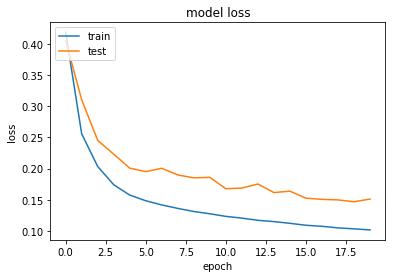

In [51]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Making predictions with the network

We will now use the network to predict values from our test examples. Those test examples have never been seen yet by the network (the network has done its own validation test by selecting a percentage of the training set we have provided it).

`x_test_exp` contains a list of test examples. rmse is the mean square prediction error on all those tests. It is an array of $horizon$ elements. rmse[0] is the mean square error on the prediction 1 step ahead, rmse[1] for two steps ahead, etc.

In [52]:
predicted = network.predict(X_test_exp)  
rmse = np.sqrt(((predicted - y_test) ** 2).mean(axis=0))
print(rmse.shape)
print(rmse)

(10,)
[0.23312034 0.30852562 0.35376413 0.38617113 0.41149776 0.43316285
 0.47012338 0.49990154 0.51765064 0.53525972]


The mean error on the whole prediction is `np.mean(rmse)`.

In [53]:
print(np.mean(rmse))

0.4149177123872597


We can also plot for on particular test the $historical$ input data followed by the $horizon$ predicted values. `x_test` is an array of tests. `x_test[i]` is a particular test (the number of available test is controlled by the `params['train_test_ratio']` parameter): 

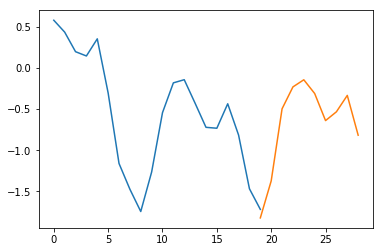

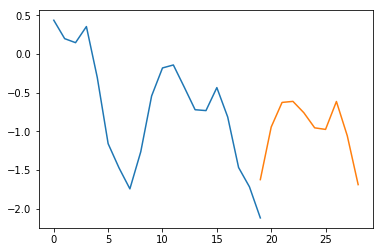

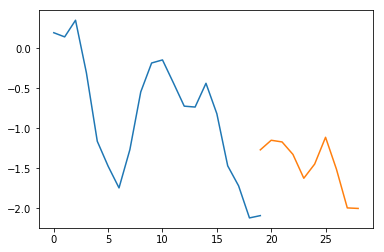

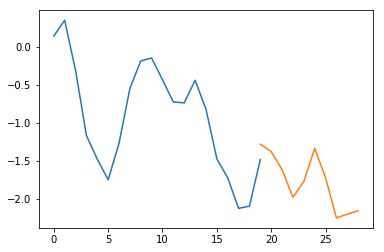

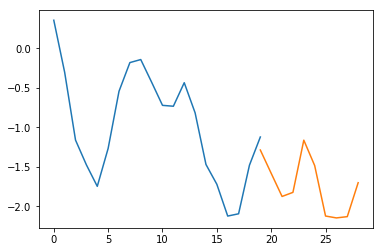

...

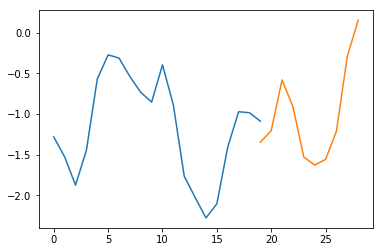

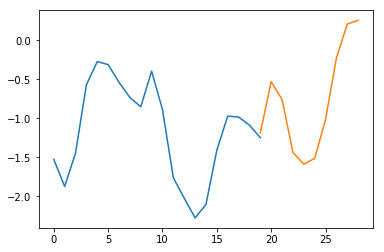

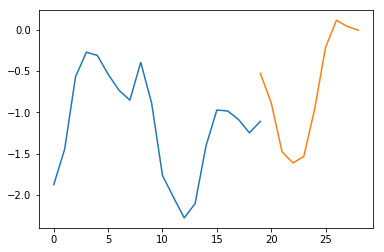

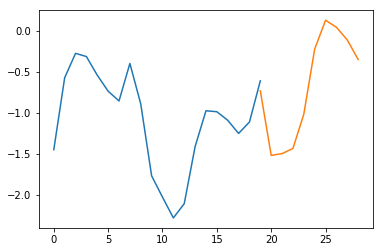

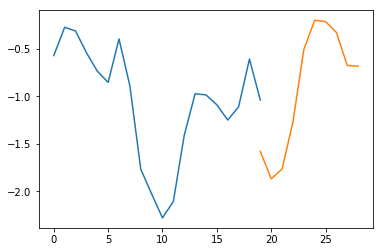

In [ ]:
 #you can try with various test number
for i in range(len(X_test)):
    X = X_test[i]
    plt.plot(X)
    n_X = np.expand_dims(np.array([X]), axis=2)
    n_y = network.predict(n_X)

    predicted_X = np.array([x for x in range(params['history']-1, params['history']+params['horizon']-1)])
    plt.plot(predicted_X, n_y[0])
    plt.show()

## Evaluating the influence of the number of hidden units

We would like to evaluate on this simple example the influence of the number of hidden units on the quality of the prediction. To easily do this, we want to build a function `testHistory` with one parameter  (the number `n` of neurons in the hidden unit) and returns the means square error of prediction on the test (the `np.mean(rse)` computed previously).
This function will have to:
* build the neural network
* compile it
* train it 
* make all the predictions on the available tests
* evaluation the mean square error of the predictions

All the code has been previously written and must be simply copied in this function. As this function will take some time to compute, you will add the following `print(".", end='')` when the network has finished learning so that feedback is given on the screen.


In [ ]:
def testHidden(n):
    # build the network
    inputs, outputs = model_lstms_fn(n, params['history'], 1, params['horizon'], num_layers=params['num_layers'])
        
    # compile the network
    network = Model(inputs, outputs)
    network.compile(loss="mean_squared_error", optimizer=params['optimization_alg'])
    network.summary()
    
    # train the network
    history=network.fit(X_train_exp, y_train, batch_size=params['batch_size'], epochs=params['num_epochs'], validation_split=params['train_val_ratio'], verbose=1)  

    # make predictions with the network
    predicted = network.predict(X_test_exp)  
    rmse = np.sqrt(((predicted - y_test) ** 2).mean(axis=0))
    print(rmse.shape)
    print(rmse)
    
    
    print(".", end='')
    return np.mean(rmse)

Now that this function is defined, the next step is to iterate on this number of hidden unit (`for` instruction) between $1$ and $256$ with a step of 10 (`range(1,256,10`) and call your `testHidden()` function. All the error results must be put in an array (see `np.append()` on  ). Plot this error array to see how this error evolves with the number of hidden units. What is the conclusion ?


In [ ]:
result = np.array([])
x = np.array([])

for i in range(1,33, 10):
    err=testHidden(i)
    result= np.append(result,[err])
    x=np.append(x,[i])

plt.plot(x, result)

We will now evaluate errors impact on the input data. We will add random errors on `nb` randomly selected points:

In [ ]:
from random import uniform
from random import randint

def add_noise(data, nb, factor):
    """
    Multiply nb randomly located points in the data by a max factor coeffcient
    """
    result = np.copy(data) 
    for _ in range(nb):
        i = randint(0,len(data)-1)
        err = uniform(0,factor)
        result[i] *= err
    
    return(result)


In [ ]:
test = add_noise(sequence,80,2)
plt.plot(test)
# to complete : plot the test points

Copy here the same actions as previously:
* Creates the train and test array. 
* Add noise to the train array: `train = add_noise(train, 10, 5)`. The test array are the correct value. Having a good prediction on the test array will mean that the network has filtered the error while learning.
* Normalize, "Windowize" and expands the two arrays
* Loop on the number of hidden units and plot the corresponding mean square error.
* Add more noise:  `train = add_noise(train, 60, 10)`. You should observe a worse prediction error for high numbers of hidden units, indicating that the network has enough resources to learn the error (overfitting) and so is poorly generalizing.



In [ ]:
# to complete
data = np.array(sequence) # transforms the Python list in a numpy array

# compute the training and testing arrays
train,test = get_train_test(data,params['train_test_ratio'])
train = add_noise(train, 10, 5)

# normalize the training array
ntrain_set, train_mean, train_std = normalize(train)

# normalize the test list using the mean and standard deviation of the training array
ntest_set = normalize(test, mean = train_mean, std = train_std)

# computes all the arrays of size history and horizon (all the training examples)
X_train, y_train = windowize(ntrain_set, params['history'], f_horizon=params['horizon'])

# computes all the arrays of size history and horizon (all the testing examples)
X_test, y_test = windowize(ntest_set, params['history'], f_horizon=params['horizon'])

X_train_exp = np.expand_dims(X_train, axis=2)
X_test_exp = np.expand_dims(X_test, axis=2)

result = np.array([])
x = np.array([])

for i in range(1,33, 10):
    err=testHidden(i)
    result= np.append(result,[err])
    x=np.append(x,[i])

plt.plot(x, result)
train = add_noise(train, 60, 10)

You can now try to experiment with the other parameters to see how the network behaves:
* history size 
* batch size
* number of epochs
* number of layers
* bi-directional LSTM instead of standard uni-directional lstm

### Hint for changing number of layers:
    
You can also analyse the effect of deeper recurrent units by changing the "params['num_layers']". e.g. with two layers of recurrent units: params['num_layers'] = 2

After changing "num_layer" parameter, get new network model, compile and train as explained in the earlier examples.

### Hint for using bi-directional LSTM:
the given function generating a recurrent network model model_lstms_fn is to build a model with standard LSTM (uni-directional)
by using LSTM keras layer as follows:
    
    LSTM(units=num_hidden_neurons, return_sequences=True)(layer)

To be able to use bi-directional LSTM, we can change LSTM layer with an bi-directional LSTM layer as follows:
    
    Bidirectional(LSTM(units=hidden_neurons, return_sequences=True))(layer)


## Generalization and dealing with overfitting:

As we discussed during lectures increasing the number of parameters the complexity and capacity increases.

An example of regression is given as follows (image is taken from Machine Learnign course of Andrew Ng):

![Illustration of underfitting right and overfitting](Figures/underfitting_overfitting_ng.png "Regression example of underfitting, right, overfitting")  

Here:
* Left is an example of underfitting 
* Middle is a right fitting example
* Right is as overfitting example
   
In the figure, going from left to right capacity of model increases. To avoid overfitting we can try differnt ways to reduce the capacity of our model. With over capacity, we do not just fit to underlying true function also the noise in the data. 

Possible ways of dealing with overfitting are as follows:
* Early stopping
* Weight decay
* Adding noise (e.g. drop out not given here)



### Early stopping: 

One simple way of dealing with this is stopping training before the model starts to fit to noise, this is called early stopping. To be able to understand where to stop we follow the error on a separate dataset which is called validation set. The error on the validation set is an approximation of generalization error, which tell how general our trained model. In other words, how our model behaves on a unseen dataset. 
We follow the error on the validation set while training and stop training where the validation error stop reducing.
Following curve illustrates an example of early stopping by observing training validation error curves through number of epochs (image taken from [researchgate](https://www.researchgate.net/figure/Early-stopping-method_fig3_283697186)):

![early stopping](Figures/Early-stopping-method.png  "Training curves")

We can use builtin early stopping functionality of keras:
```
filepath = 'checkpoints/weights.best.hdf5'
checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=0, mode='min')
callbacks_list = [checkpoint, early_stop] #, tensor_board]
network.fit(X_train, y_train, batch_size=params['batch_size'], epochs=params['num_epochs'], validation_split=params['train_val_ratio'], callbacks=callbacks_list)  
```

(Here, patience argument of EarlyStopping function determines how long in terms of number of epochs to wait for any improvement)

### Weight decay:

We can encourage our model to have less capacity by adding parameter weight in the objective funtion. Here, our objective function is our fitting error and norm of parameters. Initially without regularization, objective function is solely on objective function.
The most comment two weight decaying approaches are using L1 norm (absolute value of an error matrix) or L2 norm (squared error). Since, L2 norm is more comman, we give examples with them.

Weight decaying in keras can be obtained by specifying while adding the layer.
For an RNN layer:
* regularization on the recurrent connection (hidden-to-hidden weights):
* `params["regularization_constant"] = 0.01` (typically take values of order of 10 e.g. 0.01, 0.1, 0.1111)
* `reg = regularizers.l2` (regularization_constant)
* regularization on the recurrent connection (hidden-to-hidden weights):
`LSTM(units=num_hidden_neurons, recurrent_regularizer=reg, return_sequences=True)(layer)`
* regularization on the recurrent connection (input-to-hidden weights):
`LSTM(units=hidden_neurons, recurrent_regularizer=reg, kernel_regularizer=reg, return_sequences=True)(layer)`


